In [1]:
#import neccessary modules
import json
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from data_preprocessing import csv_to_dataset_list, extract_gyroscope_data
from scipy.interpolate import interp1d
from sklearn.cluster import DBSCAN, KMeans
from scipy.stats import zscore
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial import distance
import scipy
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.interpolate import interp1d
import time

In [2]:
# helper functions
from timeseries_helpers import datasetstorer
from timeseries_helpers import dataset_importer
from timeseries_helpers import database_importer
from timeseries_helpers import standardizer

In [3]:
# plotting functions
from timeseries_helpers import timeseries_plotter
def extract_accelerometer_data(csv_file_path, nano = True, startpunkt=550):
    # Load the CSV file into a DataFrame
    df = pd.read_csv(csv_file_path)
    
    df = df[startpunkt:].copy()

    # Extract the accelerometer data columns
    # Modify the column names based on your file's actual headers
    accelerometer_data = df[['accelerometerTimestamp_sinceReboot(s)','accelerometerAccelerationX(G)', 'accelerometerAccelerationY(G)', 'accelerometerAccelerationZ(G)']]
    accelerometer_data = accelerometer_data.rename(columns={'accelerometerTimestamp_sinceReboot(s)':'timestamp', 'accelerometerAccelerationX(G)':'x', 'accelerometerAccelerationY(G)':'y', 'accelerometerAccelerationZ(G)':'z'})
    # drop rows with NaN values
    accelerometer_data = accelerometer_data.dropna()
    accelerometer_data = accelerometer_data.reset_index(drop=True)

    # let timestampt column start with 0 and change it from seconds to nanoseconds
    first_timestamp = accelerometer_data['timestamp'][0]
    accelerometer_data['timestamp'] = accelerometer_data['timestamp'] - first_timestamp
    if nano:
        accelerometer_data['timestamp'] = (accelerometer_data['timestamp'] * 1e9)
    
    #accelerometer_data['timestamp'] = (accelerometer_data['timestamp'] * 1000)
    
    
    #accelerometer_data['timestamp'] = (accelerometer_data['timestamp'] * 1e9).astype(float)

    #accelerometer_data.to_json(r'C:\Users\Raoul\Documents\GitHub\Boxschlag-Klassifikation\accelerometer_data.json', orient='records', lines=True)

    #returns a dataframe
    return accelerometer_data

In [4]:
#open json dataset

"""
# Mac
data_Kinn_Acc = extract_accelerometer_data(r'/Users/raouldoublan/Documents/GitHub/Boxschlag-Klassifikation/data/Max_Kinnhacken.csv')
with open(r'/Users/raouldoublan/Documents/GitHub/Boxschlag-Klassifikation/data/complete_smartpunch_dataset_7606punches.json', 'r') as f:
    jsnDataset = json.load(f)
"""
# Tower
data_Kinn_Acc = extract_accelerometer_data(r'C:\Users\Raoul\Documents\GitHub\Boxschlag-Klassifikation\data\Max_Kinnhacken.csv')
data_Kinn_Acc_2 = extract_accelerometer_data(r'C:\Users\Raoul\Documents\GitHub\Boxschlag-Klassifikation\data\Max_Kinnhacken.csv', False)
with open(r'C:\Users\Raoul\Documents\GitHub\Boxschlag-Klassifikation\data\complete_smartpunch_dataset_7606punches.json', 'r') as f:
    jsnDataset = json.load(f)

In [5]:
print(data_Kinn_Acc)
print(data_Kinn_Acc_2)
print(jsnDataset[0])

          timestamp         x         y         z
0      0.000000e+00  0.739594  0.358810 -0.562973
1      9.969000e+06  0.728119  0.300812 -0.555084
2      1.993700e+07  0.735657  0.260269 -0.555359
3      2.990600e+07  0.740021  0.261002 -0.569962
4      3.987500e+07  0.738632  0.268356 -0.582336
...             ...       ...       ...       ...
19327  1.926604e+11 -0.195786 -0.178268 -0.970993
19328  1.926704e+11 -0.178665 -0.194626 -0.990097
19329  1.926804e+11 -0.179794 -0.173599 -0.993530
19330  1.926903e+11 -0.126511 -0.064316 -0.988358
19331  1.927003e+11 -0.269653 -0.224777 -0.967087

[19332 rows x 4 columns]
        timestamp         x         y         z
0        0.000000  0.739594  0.358810 -0.562973
1        0.009969  0.728119  0.300812 -0.555084
2        0.019937  0.735657  0.260269 -0.555359
3        0.029906  0.740021  0.261002 -0.569962
4        0.039875  0.738632  0.268356 -0.582336
...           ...       ...       ...       ...
19327  192.660429 -0.195786 -0.178268 

In [6]:
# Funktionen
def data_to_raw(data, label):
    data = data.reset_index()
    first_timestamp = data.loc[0, 'timestamp']
    data['timestamp'] = data['timestamp'] - first_timestamp

    if data.empty:
        print('Data is empty')
        return None
    if len(data) == 0:
        periodNS = data.loc[0, 'timestamp']
        
    else:
        periodNS = data.loc[len(data)-1, 'timestamp'] - data.loc[0, 'timestamp']
        


    # create raws
    raws = []
    for idx, row in data.iterrows():
        raw = {'_id': idx, 'timestamp': row['timestamp'], 'x': row['x'], 'y': row['y'], 'z': row['z']}
        raws.append(raw)

    # insert raws into dataset
    one_punch = {'label': label, 'count': len(data), 'periodNS': periodNS ,'raws': raws}

    return one_punch

def auto_labeling(data, height, distance, label):
    """
    Args:
        label: 1 ist Gerade, 2 ist Kinnhacken, 3 ist Kopfhacken

    Returns:
    """
    # liste mit Schlägen
    punches = []

    # PCA
    r_data = reduce_dimensionality(data)

    # df mit den Hochpunkten
    p = scipy.signal.find_peaks(r_data['one_value'], height=height, distance=distance)
    peaks = data.iloc[p[0]]

    # eine Spalte mit den Indizes der Hochpunkte wird erstellt
    peaks = peaks.reset_index()
    print(peaks)

    # start and endpoint of punches
    start = 0
    end = 0

    first_iteration = True
    """
    # Handle the first iteration case
    start = 550
    end = (peaks.loc[1, 'index'] + peaks.loc[0, 'index']) // 2

    # Label the data from start to end
    ds = data_to_raw(data[start:end], label)
    punches.append(ds)

    # Iterate over the rest of the peaks
    for idx in range(1, len(peaks)):
        start = end + 1
        if idx == len(peaks) - 1:
            end = len(data)
        else:
            end = (peaks.loc[idx, 'index'] + peaks.loc[idx + 1, 'index']) // 2
    
        # Label the data from start to end
        ds = data_to_raw(data[start:end], label)
        punches.append(ds)
    
        print(idx)
    """
    
    for idx, row in peaks.iterrows():
        #peak_index = row['index']
        if first_iteration:
            start = 0
            t = (peaks.loc[1, 'timestamp'] + peaks.loc[0, 'timestamp']) // 2
            t_2 = find_nearest_timestamp(data, t)
            end = find_index_by_timestamp(data, t_2)
            first_iteration = False
        elif idx == len(peaks) - 1:
            start = end +1
            end = len(data)-1
        else:
            #start = (peaks.loc[idx - 1, 'index'] + peaks.loc[idx, 'index']) // 2
            start = end+1
            t = (peaks.loc[idx, 'timestamp'] + peaks.loc[idx + 1, 'timestamp']) // 2
            t_2 = find_nearest_timestamp(data, t)
            end = find_index_by_timestamp(data, t_2)
        
        print(str(idx) + '. Durchlauf: start:' + str(start) +  ', ende:' + str(end))
        #print(peaks.loc[idx, 'index'])
        # Label the data from start to end
        ds = data_to_raw(data[start:end], label)
        punches.append(ds)
    

    return punches

def find_nearest_timestamp(df, number):
    absolute_difference_function = lambda timestamp : abs(timestamp - number)
    nearest_timestamp = df['timestamp'].map(absolute_difference_function).idxmin()
    #return df.loc[nearest_timestamp, ['timestamp']]
    return nearest_timestamp

def find_index_by_timestamp(df, timestamp):
    df = df.reset_index().copy()
    index = df.loc[df['timestamp'] == timestamp].index
    absolute_difference_function = lambda index : abs(index - timestamp)
    index = df['index'].map(absolute_difference_function).idxmin()
    print(index)
    return index

def reduce_dimensionality(data):
    r_data = data[['x', 'y', 'z']].copy()
    #time_c = data[['timestamp']].copy()
    pca = PCA(n_components=1)
    std_data = StandardScaler().fit_transform(r_data)
    gsts_array = pca.fit_transform(std_data)
    finalDf = pd.DataFrame(data = gsts_array, columns = ['one_value'])
    #finalDf = pd.concat([df,time_c], axis = 1)
    return finalDf

def data_to_list(raws, axis='x'):
    data = []
    for e in raws:
        data.append(e[axis])
    return data

def data_to_list2(raws, axis='x'):
    return [e[axis] for e in raws]

def plot_ds(ds,saveImage=False,imageName="no_name"):
    x,y,z = [],[],[]
    for ds_e in ds:
        raws = ds_e['raws']
        raws[0]
        x += data_to_list2(raws, axis='x')
        y += data_to_list2(raws, axis='y')
        z += data_to_list2(raws, axis='z')
    
    t = np.arange(0, len(x))

    fig, ax = plt.subplots(figsize=(20,10))
    ax.plot(t, x, 'r.',label='x-Achse')
    ax.plot(t, y, 'b*',label='y-Achse')
    ax.plot(t, z, 'g^',label='z-Achse')

    ax.set(xlabel='Abtastwerte', ylabel='a (in m/s²)',
           title='Rohdaten eines Upper-Cuts')
    ax.grid()
    plt.legend()
    if saveImage:
        if imageName.endswith('.png'):
            plt.savefig(imageName)
        else:
            name = imageName+'.png'
            plt.savefig(name)
    plt.show()
    
def plot_ds_element(ds_e):
    raws = ds_e['raws']
    raws[0]
    x = data_to_list2(raws, axis='x')
    y = data_to_list2(raws, axis='y')
    z = data_to_list2(raws, axis='z')
    t = np.arange(0, len(x))

    fig, ax = plt.subplots(figsize=(20,10))
    ax.plot(t, x, label='x')
    ax.plot(t, y, label='y')
    ax.plot(t, z, label='z')

    ax.set(xlabel='datastamps', ylabel='a (in m/s²)',
           title='single dataset element of type: '+ds_e['label'])
    ax.grid()
    plt.legend()
    plt.show()
    
def jsonData_to_dataset_in_timedifference_us(data):
    """Creates a list of dataframe objects from a given json object. Converts the timestamp col with absolute timestamps in us.
       The last timestamp is the period time in us since the punch started.

    Keyword arguments:
        data            -- JSON Database representation dumped from mongoDB with timestamps in nanoseconds (type: object)

    Returns:
        list            -- List object containing the datasets as dataframe objects with timestamps in 'since last timestamp' format.
    """

    the_cols = ['x', 'y', 'z','timestamp', 'label']
    the_data = []

    for value in data:
        the_raws = []
        the_indxs = []
        idx = 0
        #raw_time_us = 0
        for raw in value['raws']:
            #raw_time_us += int(raw['timestamp'])//1000
            t = int(raw['timestamp'])//1000
            the_raws.append([raw['x'], raw['y'], raw['z'], int(
                t), value['label']])
            the_indxs.append(idx)
            idx += 1
        the_data.append(pd.DataFrame(the_raws, the_indxs, the_cols))
        
    return the_data

def normate_dataset_period(periodLengthInMS, samplingRateUS, dataset, interpolationKind='cubic'):
    """Normates the period of a given dataset list. Datasets in dataframe format! Stretches the periods with interpolation method choosen with the interpolationKind parameter. Default: Cubic. Converting mechanism is made for the notation style of the smartPunch project.

    Keyword arguments:
        periodLengthInMS            --  Required period length in [ms] for each dataset (type: number)
        samplingRateUS              --  Sampling rate in [us] for each datapoint (type: number)
        dataset                     --  List of dataframe objects containing the datasets (type: list)
        interpolationKind           --  Interpolation method (type: string, default: 'cubic', available methods: 'linear', 'nearest', 'zero', 'slinear', 'quadratic', 'cubic',
                                        'previous', 'next', where 'zero', 'slinear', 'quadratic' or 'cubic')

    Returns:
        list        -- List object containing the interpolated datasets as dataframe objects with the stretched/compressed time period.
    """

    print("Starting new normalization/interpolation...")

    # interpolated period length in us
    interp_period_us = periodLengthInMS*1000

    # interpolated dataset array
    ds_interp = []

    # define cols for interp. dataset
    the_cols = ['x', 'y', 'z', 'timestamp', 'label']

    # ds_interp = pd.DataFrame(dataset_raws_storer,np.arange(0,data_size,1),['x','y','z']);
    # print(ds_interp)

    dataset_numb = 0

    total = len(dataset)

    # create and store the interpolation functions
    for idx, ds_el in enumerate(dataset):
        
        #print('Index: {}'.format(idx))
        if idx > 0:
            print("progress: {:.2f} %".format(idx*100/total))
            if idx % 100 == 0:
                print("progress: {:.2f} %".format(idx*100/total))

        # copy original datframe object
        # ds_el = ds_el_orig.copy(deep=True)

        # original period length
        orig_period_length_us = ds_el['timestamp'][len(ds_el['timestamp'])-1]

        # stores the interpolating functions for each dataset element and axis
        f_x = (interp1d(ds_el['timestamp'].values.copy(), ds_el['x'].values.copy(), kind=interpolationKind,
                        bounds_error=False, fill_value=(ds_el['x'][0].copy(), ds_el['x'][0].copy())))
        f_y = (interp1d(ds_el['timestamp'].values.copy(), ds_el['y'].values.copy(), kind=interpolationKind,
                        bounds_error=False, fill_value=(ds_el['y'][0].copy(), ds_el['y'][0].copy())))
        f_z = (interp1d(ds_el['timestamp'].values.copy(), ds_el['z'].values.copy(), kind=interpolationKind,
                        bounds_error=False, fill_value=(ds_el['z'][0].copy(), ds_el['z'][0].copy())))

        # helper variables
        sample_moment = 0

        # stores the interpolated raw data of the current dataset element as array(s)
        dataset_raws_storer = []
        the_indxs = []
        idx = 0

        # original period length is in intervall limit
        if orig_period_length_us <= interp_period_us:
            # interpolate x,y,z raw array of all elements in current dataset
            while sample_moment <= interp_period_us:
                dataset_raws_storer.append([float(f_x(sample_moment).copy()), float(f_y(sample_moment).copy()), float(f_z(sample_moment).copy()), int(
                    # dataset_raws_storer.append([5.3, 5.3, 5.3, int(
                    sample_moment), ds_el['label'][0]])
                sample_moment += samplingRateUS
                the_indxs.append(idx)
                idx += 1
        else:
            # original interval is to long -> center data values and cut borders
            time_to_cutoff_on_each_side = round(
                ((orig_period_length_us - interp_period_us)/2), 0)
            # print('time_to_cutoff_on_each_side in us: {}'.format(time_to_cutoff_on_each_side))

            # round((time_to_cutoff_on_each_side/samplingRateUS),0)*samplingRateUS
            pseudo_sample_moment = time_to_cutoff_on_each_side
            # print('pseudo_sample_moment in us: {}'.format(pseudo_sample_moment))

            while sample_moment <= interp_period_us:
                dataset_raws_storer.append([float(f_x(pseudo_sample_moment).copy()), float(f_y(pseudo_sample_moment).copy()), float(f_z(pseudo_sample_moment).copy()),
                                            # dataset_raws_storer.append([5.3, 5.3, 5.3,
                                            int(sample_moment), ds_el['label'][0]])
                pseudo_sample_moment += samplingRateUS
                sample_moment += samplingRateUS
                the_indxs.append(idx)
                idx += 1

       # create a new interpolated dataset entry
        ds_interp.append(pd.DataFrame(
            dataset_raws_storer, the_indxs, the_cols))

    return ds_interp

def change_strings_to_numbs(dataset):
    """Replaces the string values in the col: label with numbers.

    Keyword arguments:
        dataset             -- List of dataframe objects containing the datasets (type: list)

    Returns:
        list                -- List object containing the datasets without any strings.
    """
    hands_dict = {'right': 0, 'left': 1}
    annotator_keys = []
    annotator_values = []
    datasetList = []

    idx = 0
    for dataSet in dataset:
        datasetList.append(dataSet.copy(deep=True))
        # replace label
        datasetList[idx]['label'] = datasetList[idx]['label'].map(
            {'no-action': 0, 'Kinnhaken': 1, 'Kopfhaken': 2, 'Gerade': 3})
        
        """
        # convert lists to dict
        dictionary = dict(zip(annotator_keys, annotator_values))
        datasetList[idx]['annotator'] = datasetList[idx]['annotator'].map(
            dictionary)
        """
        
    return datasetList
    

In [7]:
print(data_Kinn_Acc)

          timestamp         x         y         z
0      0.000000e+00  0.739594  0.358810 -0.562973
1      9.969000e+06  0.728119  0.300812 -0.555084
2      1.993700e+07  0.735657  0.260269 -0.555359
3      2.990600e+07  0.740021  0.261002 -0.569962
4      3.987500e+07  0.738632  0.268356 -0.582336
...             ...       ...       ...       ...
19327  1.926604e+11 -0.195786 -0.178268 -0.970993
19328  1.926704e+11 -0.178665 -0.194626 -0.990097
19329  1.926804e+11 -0.179794 -0.173599 -0.993530
19330  1.926903e+11 -0.126511 -0.064316 -0.988358
19331  1.927003e+11 -0.269653 -0.224777 -0.967087

[19332 rows x 4 columns]


In [8]:
data = data_Kinn_Acc.copy()
json_data = auto_labeling(data, 3, 140, 'Kinnhaken')
#pca benutzen

     index     timestamp          x         y         z
0      108  1.076611e+09  -6.170441  3.703735  3.569641
1      250  2.492154e+09  -1.506287  6.646332  3.246185
2      404  4.027319e+09  -0.983246  7.832825  4.251801
3      564  5.622294e+09  -2.752594  7.483246  2.832886
4      723  7.207298e+09  -1.463287  7.089508  4.322342
..     ...           ...        ...       ...       ...
96   18069  1.801200e+11  -6.060135  7.219940  4.491608
97   18266  1.820838e+11  -6.266785  8.120041  4.844223
98   18449  1.839081e+11  -6.030609  6.740952  4.870682
99   18638  1.857921e+11  -7.583420  7.285858  5.100525
100  18849  1.878955e+11 -11.425110  7.314713  6.263351

[101 rows x 5 columns]
179
0. Durchlauf: start:0, ende:179
327
1. Durchlauf: start:180, ende:327
484
2. Durchlauf: start:328, ende:484
644
3. Durchlauf: start:485, ende:644
806
4. Durchlauf: start:645, ende:806
972
5. Durchlauf: start:807, ende:972
1141
6. Durchlauf: start:973, ende:1141
1312
7. Durchlauf: start:1142, ende:13

In [9]:

#print(json_data[1])
print(json_data[1])
#print(jsnDataset[2])


{'label': 'Kinnhaken', 'count': 147, 'periodNS': 1455417125.0019865, 'raws': [{'_id': 0, 'timestamp': 0.0, 'x': 1.055252075195312, 'y': -0.0979461669921875, 'z': -0.4130706787109375}, {'_id': 1, 'timestamp': 9969000.002456665, 'x': 1.019378662109375, 'y': -0.1201324462890625, 'z': -0.308563232421875}, {'_id': 2, 'timestamp': 19937000.000936747, 'x': 0.972900390625, 'y': -0.1094970703125, 'z': -0.3242950439453125}, {'_id': 3, 'timestamp': 29905999.999755383, 'x': 0.9402618408203124, 'y': -0.0459747314453125, 'z': -0.4282684326171875}, {'_id': 4, 'timestamp': 39874000.00187349, 'x': 0.9136199951171876, 'y': 0.05267333984375, 'z': -0.506195068359375}, {'_id': 5, 'timestamp': 49843000.00069213, 'x': 0.8904571533203125, 'y': 0.141754150390625, 'z': -0.576690673828125}, {'_id': 6, 'timestamp': 59811999.999510765, 'x': 0.865875244140625, 'y': 0.17236328125, 'z': -0.6135101318359375}, {'_id': 7, 'timestamp': 69780000.00162864, 'x': 0.8483428955078125, 'y': 0.1500091552734375, 'z': -0.577056884

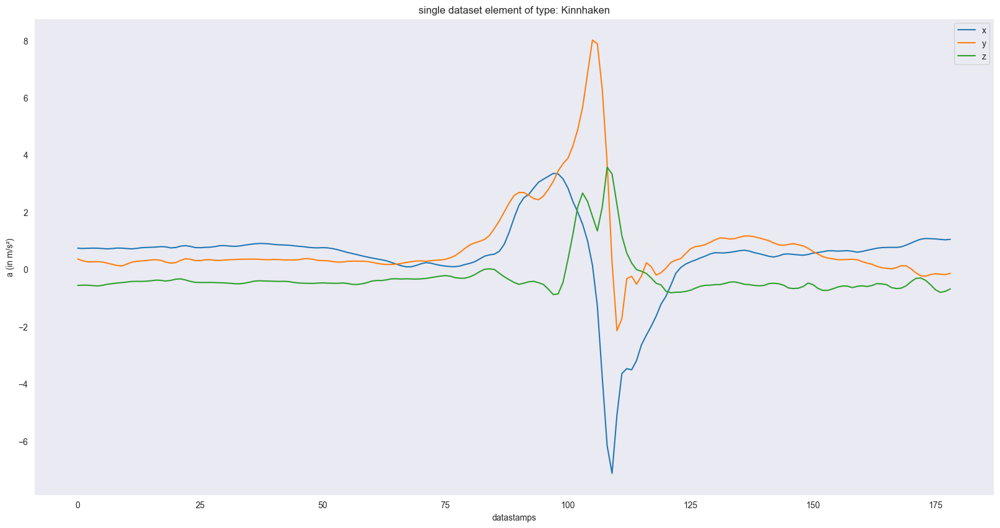

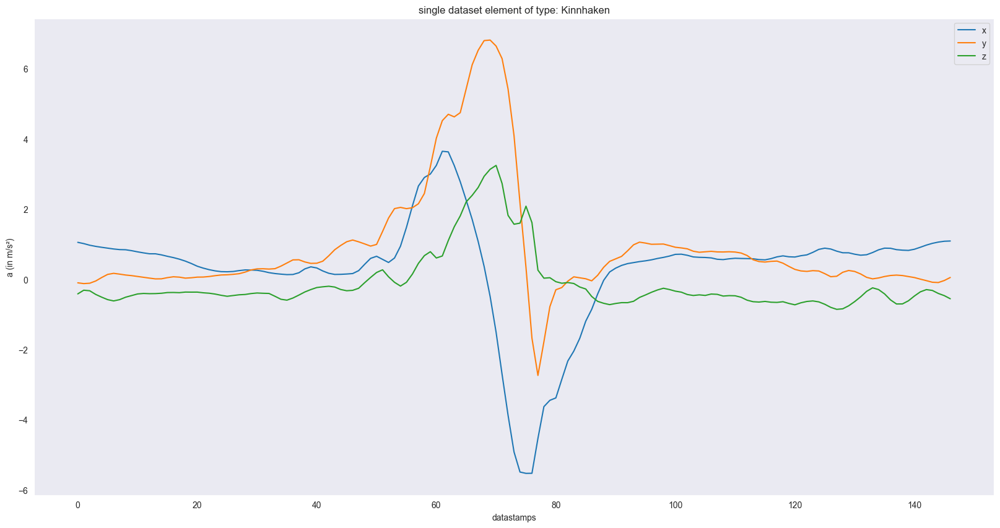

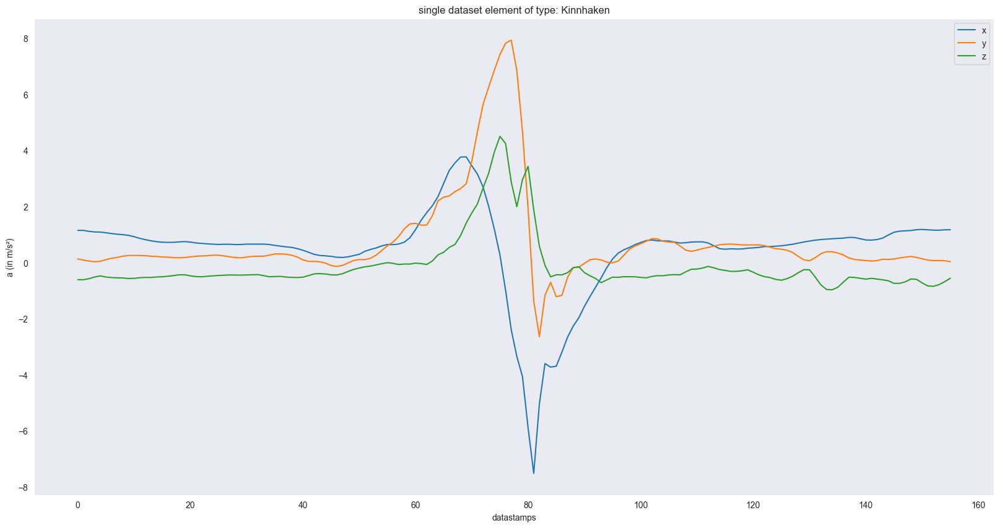

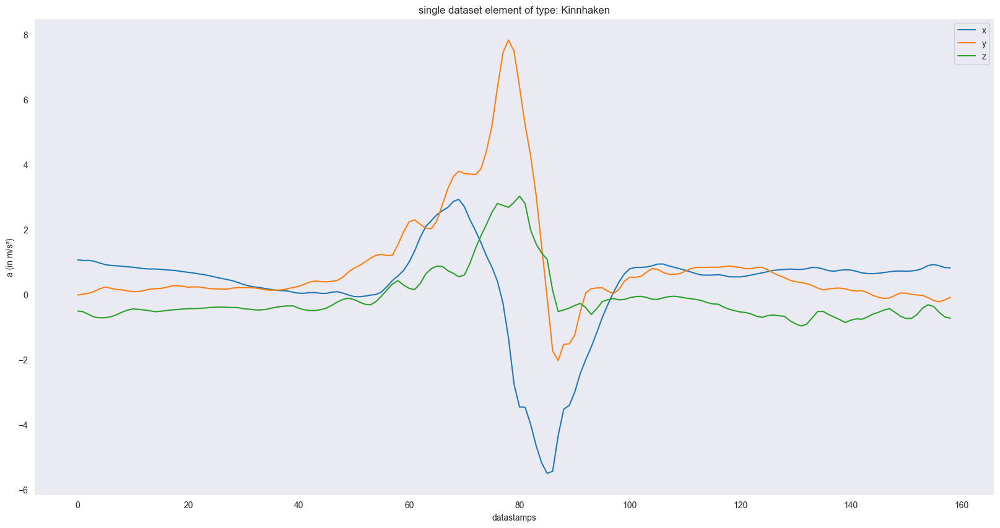

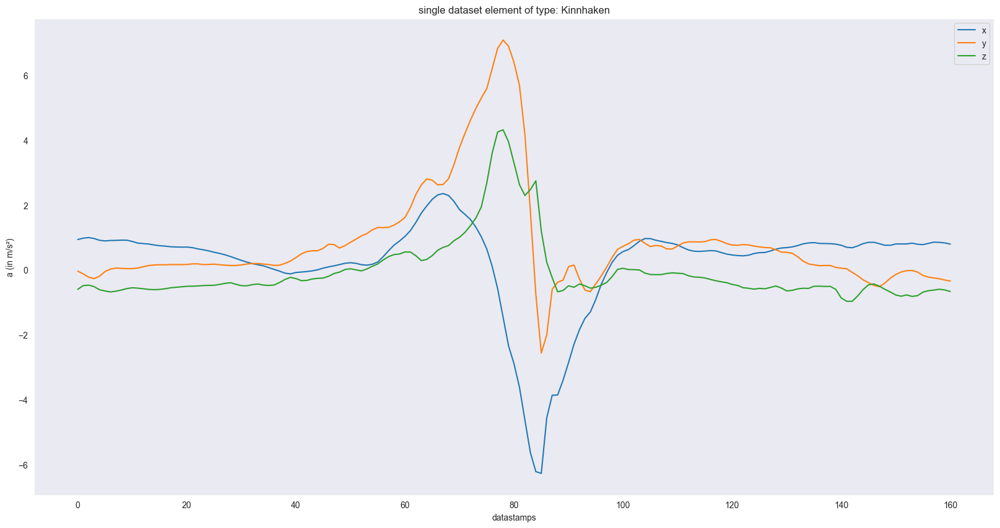

...

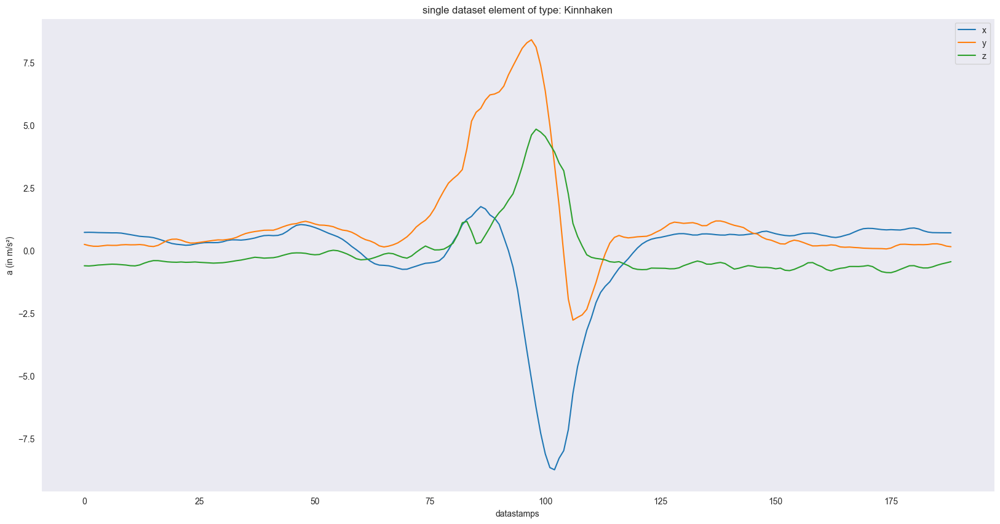

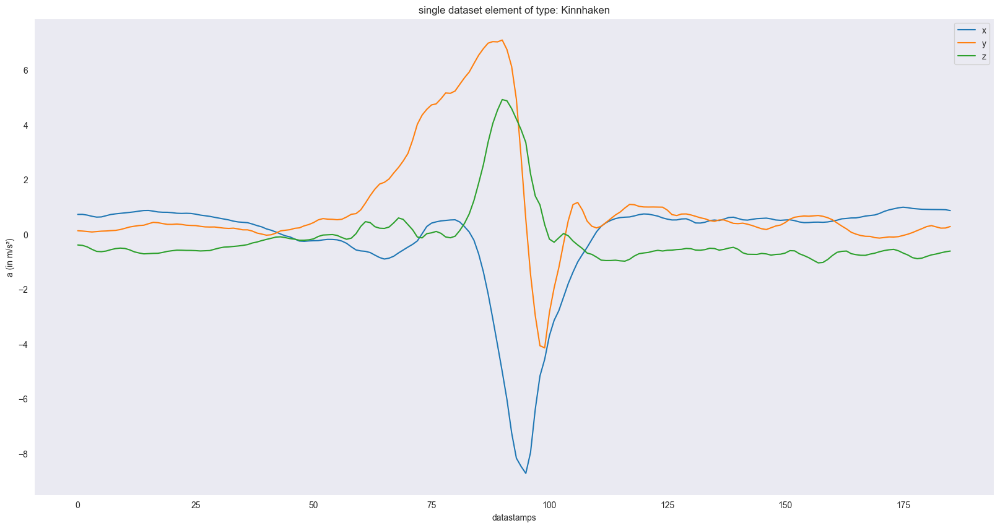

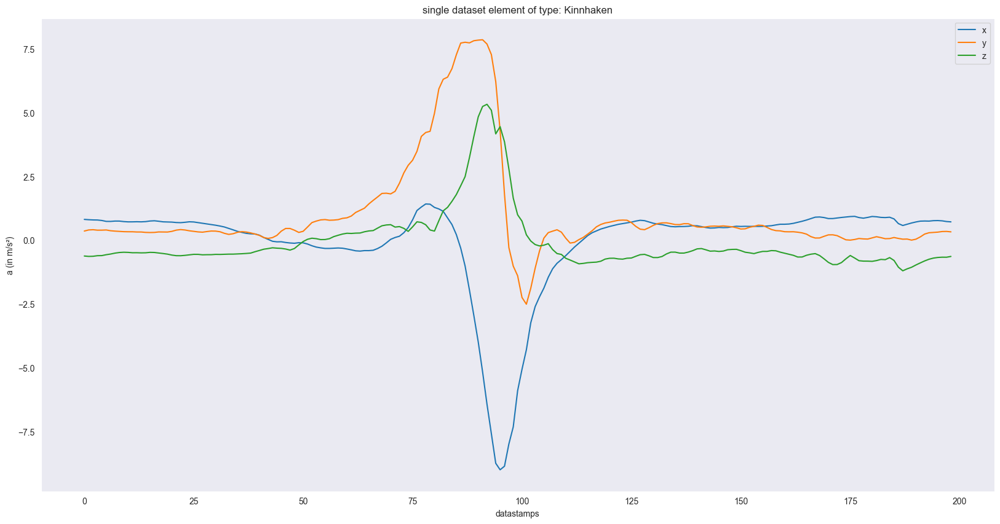

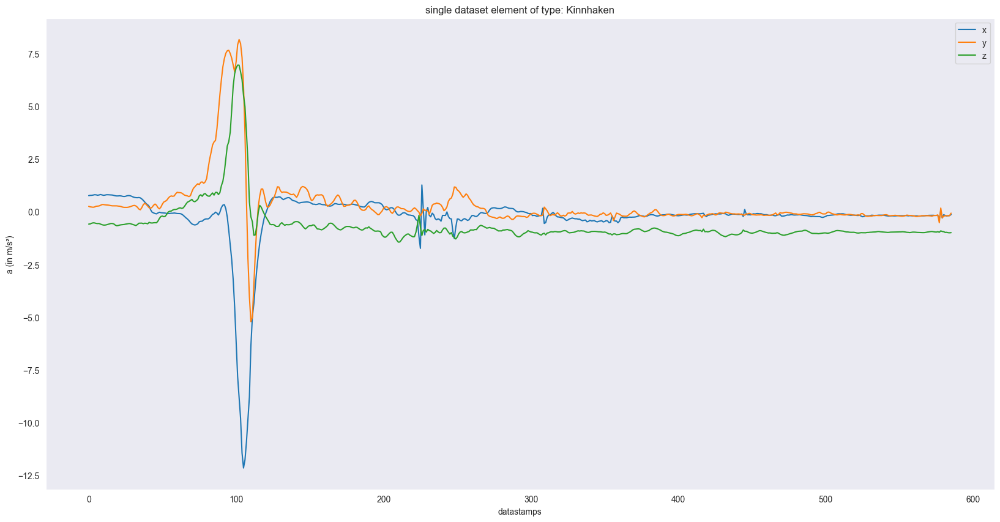

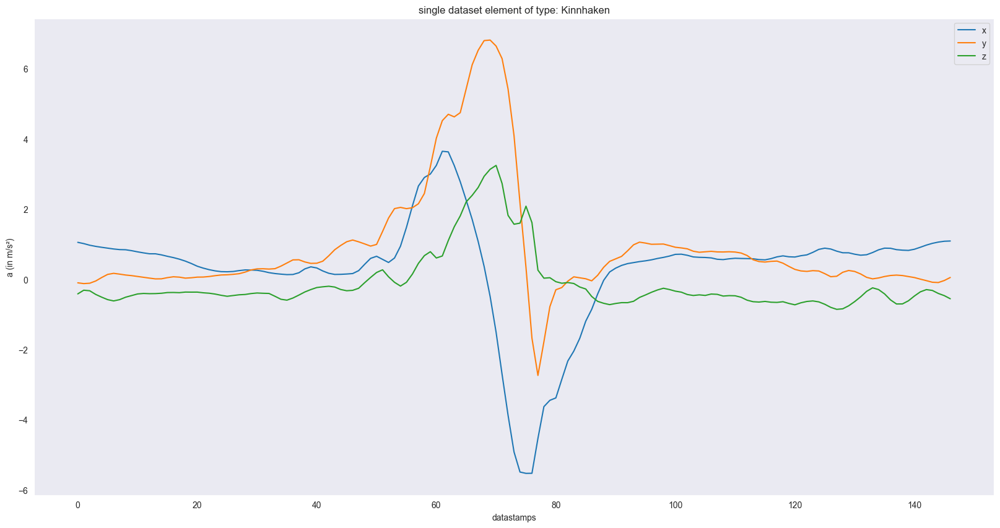

In [10]:
for i in range(0, len(json_data)):
    plot_ds_element(json_data[i])
    
plot_ds_element(json_data[1])



In [11]:
## variables
periodLengthMS = 1500
sampleRateUS = 1000

In [12]:
#convert dataset to timestamps in absolute us
ds = database_importer.jsonData_to_dataset_in_timedifference_us(data=jsnDataset)
print(ds[1])
df = jsonData_to_dataset_in_timedifference_us(data=json_data)
print(df[1])

             x         y         z  timestamp      label   hand annotator
0     8.322237 -1.923829  4.405187          0  upper-cut  right         0
1     8.350951 -1.758725  4.259224      14000  upper-cut  right         0
2     8.267202 -1.868794  4.362116      16000  upper-cut  right         0
3     8.197810 -2.053042  4.469793      32000  upper-cut  right         0
4     8.126026 -2.239682  4.601398      48000  upper-cut  right         0
..         ...       ...       ...        ...        ...    ...       ...
152   9.667004 -1.813760  0.667598    1517000  upper-cut  right         0
153   9.052048 -0.234497  0.423530    1519000  upper-cut  right         0
154   9.927821 -0.145962  2.009971    1526000  upper-cut  right         0
155  11.186446 -2.653640  2.687140    1551000  upper-cut  right         0
156  10.116854 -2.656033  2.653640    1566000  upper-cut  right         0

[157 rows x 7 columns]
            x         y         z  timestamp      label
0    1.055252 -0.097946 -0.41307

In [13]:
#ds_new = standardizer.normate_dataset_period(periodLengthMS,sampleRateUS,ds)  #normalize_dataset_period(2000,1000,ds[:5])
df_new = normate_dataset_period(periodLengthMS,sampleRateUS,df)

print(df_new[1])

Starting new normalization/interpolation...
progress: 0.99 %
progress: 1.98 %
progress: 2.97 %
progress: 3.96 %
progress: 4.95 %
progress: 5.94 %
progress: 6.93 %
progress: 7.92 %
progress: 8.91 %
progress: 9.90 %
progress: 10.89 %
progress: 11.88 %
progress: 12.87 %
progress: 13.86 %
progress: 14.85 %
progress: 15.84 %
progress: 16.83 %
progress: 17.82 %
progress: 18.81 %
progress: 19.80 %
progress: 20.79 %
progress: 21.78 %
progress: 22.77 %
progress: 23.76 %
progress: 24.75 %
progress: 25.74 %
progress: 26.73 %
progress: 27.72 %
progress: 28.71 %
progress: 29.70 %
progress: 30.69 %
progress: 31.68 %
progress: 32.67 %
progress: 33.66 %
progress: 34.65 %
progress: 35.64 %
progress: 36.63 %
progress: 37.62 %
progress: 38.61 %
progress: 39.60 %
progress: 40.59 %
progress: 41.58 %
progress: 42.57 %
progress: 43.56 %
progress: 44.55 %
progress: 45.54 %
progress: 46.53 %
progress: 47.52 %
progress: 48.51 %
progress: 49.50 %
progress: 50.50 %
progress: 51.49 %
progress: 52.48 %
progress: 53

In [14]:
print(df_new)        

[             x         y         z  timestamp      label
0     0.762938  0.303203 -0.417425          0  Kinnhaken
1     0.763638  0.304910 -0.416414       1000  Kinnhaken
2     0.764289  0.306692 -0.415369       2000  Kinnhaken
3     0.764908  0.308554 -0.414301       3000  Kinnhaken
4     0.765504  0.310484 -0.413201       4000  Kinnhaken
...        ...       ...       ...        ...        ...
1496  0.756386  0.061219 -0.505723    1496000  Kinnhaken
1497  0.757806  0.057866 -0.507820    1497000  Kinnhaken
1498  0.758976  0.054962 -0.509515    1498000  Kinnhaken
1499  0.759906  0.052480 -0.510770    1499000  Kinnhaken
1500  0.760630  0.050343 -0.511791    1500000  Kinnhaken

[1501 rows x 5 columns],              x         y         z  timestamp      label
0     1.055252 -0.097946 -0.413071          0  Kinnhaken
1     1.053092 -0.100836 -0.397170       1000  Kinnhaken
2     1.050521 -0.103655 -0.382477       2000  Kinnhaken
3     1.047573 -0.106373 -0.368991       3000  Kinnhaken
4   

## Replace all strings in the datasets
For use ML algorithms later, replace all strings in the dataset first.

In [15]:
ds_to_export = change_strings_to_numbs(df_new)

In [16]:
print(ds_to_export[0])

             x         y         z  timestamp  label
0     0.762938  0.303203 -0.417425          0    NaN
1     0.763638  0.304910 -0.416414       1000    NaN
2     0.764289  0.306692 -0.415369       2000    NaN
3     0.764908  0.308554 -0.414301       3000    NaN
4     0.765504  0.310484 -0.413201       4000    NaN
...        ...       ...       ...        ...    ...
1496  0.756386  0.061219 -0.505723    1496000    NaN
1497  0.757806  0.057866 -0.507820    1497000    NaN
1498  0.758976  0.054962 -0.509515    1498000    NaN
1499  0.759906  0.052480 -0.510770    1499000    NaN
1500  0.760630  0.050343 -0.511791    1500000    NaN

[1501 rows x 5 columns]


In [17]:
fileName = r"../../Datasets/Normalized/complete_smartpunch_dataset_periodMS" + str(periodLengthMS)+"_sampleUS"+str(sampleRateUS)+".csv";
# datasetstorer.export_list_of_dataframes_to_csv(ds_to_export,r"../../Datasets/Normalized/complete_smartpunch_dataset_periodMS2000_sampleUS1000.csv")
datasetstorer.export_list_of_dataframes_to_csv(ds_to_export,fileName)

OSError: Cannot save file into a non-existent directory: '..\..\Datasets\Normalized'